# Capstone Project - The Battle of Neighborhoods

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

The objective of this project is to define the best borough/neighborhoods in Paris city to open new restaurant.
This city is full of various type of restaurant: french, italine, chinese, indian, lebanese...
So, we should examine and explore the geographic distribution of most restaurant, and select the suitable place.

## Data <a name="data"></a>

In this section, we will present the different data will be used to finalize our project. we will besed on the below datasets to analyse Paris city.
Paris is composed of 20 boroughs, each one is distinguished by it's number. The URL below provide the those arrondissements and there details:

https://opendata.paris.fr/explore/dataset/arrondissements/table/?dataChart

Tt's downloadable also in https://data.opendatasoft.com/explore/dataset/arrondissements%40parisdata/export/ To facilate the export of data, the dataset is imported in github repository : https://raw.githubusercontent.com/AR-data-science/Coursera_Capstone/master/Arrondissements_.csv

### Explore Paris city's geographical coordinates dataset to get neighborhoods / borough

Paris has 20 boroughs and 80 essantial neighborhoods. We should segment the neighborhoods and explore them, we will explore the dataset above that contains the details of each neighborhood : boroughs, latitude and logitude coordiantes.

Let's get started with downloading the librairies:

In [21]:
# to handle data in a vectorized manner:
import numpy as np 

# data analsysis:
import pandas as pd 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# to handle JSON files:
import json 

!conda install -c conda-forge geopy --yes 
# convert an address into latitude and longitude values:
from geopy.geocoders import Nominatim 

# library to handle requests:
import requests 
# tranform JSON file into a pandas dataframe:
from pandas.io.json import json_normalize 

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

from bs4 import BeautifulSoup

# Import k-means from clustering stage
from sklearn.cluster import KMeans

print('End import libraries')

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

End import libraries


The dataset is available in the below URL: https://opendata.paris.fr/explore/dataset/arrondissements/table/.
But to skip the step of converting the csvor json file, we will use this link: https://raw.githubusercontent.com/AR-data-science/Coursera_Capstone/master/Arrondissements_.csv

In [3]:
# Download the dataset and read it into a pandas dataframe.
paris_data = pd.read_csv('https://raw.githubusercontent.com/AR-data-science/Coursera_Capstone/master/Arrondissements_.csv')
print('file imported')

file imported


#### Load and explore the data

In [4]:
paris_data

,CAR,NAME,NSQAR,CAR.1,CARINSEE,LAR,NSQCO,SURFACE,PERIMETRE,Geometry_X,Geometry_Y
0,3,Temple,750000003,3,3,3eme Ardt,750001537,1170882828,4519264,48.862872,2.360001
1,19,Buttes-Chaumont,750000019,19,19,19eme Ardt,750001537,6792651129,11253182,48.887076,2.384821
2,14,Observatoire,750000014,14,14,14eme Ardt,750001537,5614877309,10317483,48.829245,2.326542
3,10,Entrepot,750000010,10,10,10eme Ardt,750001537,2891739442,6739375,48.876130,2.360728
4,12,Reuilly,750000012,12,12,12eme Ardt,750001537,16314782637,24089666,48.834974,2.421325
5,16,Passy,750000016,16,16,16eme Ardt,750001537,16372542129,17416110,48.860392,2.261971
6,11,Popincourt,750000011,11,11,11eme Ardt,750001537,3665441552,8282012,48.859059,2.380058
7,2,Bourse,750000002,2,2,2eme Ardt,750001537,991153745,4554104,48.868279,2.342803
8,4,Hotel-de-Ville,750000004,4,4,4eme Ardt,750001537,1600585632,5420908,48.854341,2.357630
9,17,Batignolles-Monceau,750000017,17,17,17eme Ardt,750001537,5668834504,10775580,48.887327,2.306777


### Cleaning the Data

#### Rename columns

In [5]:
# Rename the columns: 
#NAME -> borough 
#CAR -> borough_Num
#Geometry_X -> Latitude
#Geometry_Y -> Longitude


paris_data.rename(columns={'NAME': 'borough ', 'CAR': 'borough_Num', 'Geometry_X': 'Latitude', 'Geometry_Y': 'Longitude',  'LAR': 'French_Name'}, inplace=True)
paris_data

,borough_Num,borough,NSQAR,CAR.1,CARINSEE,French_Name,NSQCO,SURFACE,PERIMETRE,Latitude,Longitude
0,3,Temple,750000003,3,3,3eme Ardt,750001537,1170882828,4519264,48.862872,2.360001
1,19,Buttes-Chaumont,750000019,19,19,19eme Ardt,750001537,6792651129,11253182,48.887076,2.384821
2,14,Observatoire,750000014,14,14,14eme Ardt,750001537,5614877309,10317483,48.829245,2.326542
3,10,Entrepot,750000010,10,10,10eme Ardt,750001537,2891739442,6739375,48.876130,2.360728
4,12,Reuilly,750000012,12,12,12eme Ardt,750001537,16314782637,24089666,48.834974,2.421325
5,16,Passy,750000016,16,16,16eme Ardt,750001537,16372542129,17416110,48.860392,2.261971
6,11,Popincourt,750000011,11,11,11eme Ardt,750001537,3665441552,8282012,48.859059,2.380058
7,2,Bourse,750000002,2,2,2eme Ardt,750001537,991153745,4554104,48.868279,2.342803
8,4,Hotel-de-Ville,750000004,4,4,4eme Ardt,750001537,1600585632,5420908,48.854341,2.357630
9,17,Batignolles-Monceau,750000017,17,17,17eme Ardt,750001537,5668834504,10775580,48.887327,2.306777


#### Remove columns

In [6]:
# remove unnecessary columns like : NSQAR,CAR.1,CARINSEE,NSQCO,SURFACE,PERIMETRE

paris_data.drop(['NSQAR','CAR.1','CARINSEE','NSQCO','SURFACE', 'PERIMETRE' ], axis=1, inplace=True)
paris_data

,borough_Num,borough,French_Name,Latitude,Longitude
0,3,Temple,3eme Ardt,48.862872,2.360001
1,19,Buttes-Chaumont,19eme Ardt,48.887076,2.384821
2,14,Observatoire,14eme Ardt,48.829245,2.326542
3,10,Entrepot,10eme Ardt,48.876130,2.360728
4,12,Reuilly,12eme Ardt,48.834974,2.421325
5,16,Passy,16eme Ardt,48.860392,2.261971
6,11,Popincourt,11eme Ardt,48.859059,2.380058
7,2,Bourse,2eme Ardt,48.868279,2.342803
8,4,Hotel-de-Ville,4eme Ardt,48.854341,2.357630
9,17,Batignolles-Monceau,17eme Ardt,48.887327,2.306777


### Use the geopy library to get the latitude and longitude values of Paris

In [11]:
# Find the geographic coordinates of Paris :Latitude and Longitude
from geopy.geocoders import Nominatim 

address = 'Paris'

# Define the user_agent as Paris_explorer
geolocator = Nominatim(user_agent="Paris_explorer")

location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

print('The geographic coordinates of Paris city are {}, {}.'.format(latitude, longitude))

The geographic coordinates of Paris city are 48.8566969, 2.3514616.


## Methodology <a name="methodology"></a>

In order to get the best result, we will follow the below steps:
    - Get the borough's details
    - Get the most communes venues for each borough
    - Define the borough with low restaurant density
    - Display the selected borough's details

## Analysis <a name="analysis low restaurant density"></a>

### Use the Foursquare API to explore the data

#### Define Foursquare Credentials and Version

In [12]:
CLIENT_ID = 'KRRNXR4HZ3U5J2AQNN3CMM1LD0U0BWJNCUXXRYWHM1NCIDWD'
CLIENT_SECRET = 'D4N2KXB2GCXNHX0FSFUIS5ATSPLVCCTE350PACAGSFOD3ZVV'
VERSION = '20200128'

print('foursquare identified')

foursquare identified


In this stage, I want to pick all the details of the 1rst borough, so first of all, I have to get the row index with borough number is 1

In [17]:
paris_data.index[paris_data['borough_Num'] == 1].tolist()

[11, 'borough_Num']

It's 11

#### work with first borough

In [24]:
borough_num = paris_data.loc[11, 'borough_Num']
borough_latitude = paris_data.loc[11, 'Latitude'] 
borough_longitude = paris_data.loc[11, 'Longitude'] 

print('Geographical coordination of the {}st borough are {}, {}.'.format(borough_num, borough_latitude, borough_longitude))

Geographical coordination of the 1st borough are 48.862562700000005, 2.336443362.


##### Get the top 100 venues that are in the 1st borough within a radius of 500 meters

In [26]:
LIMIT = 100 
radius = 500 

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    borough_latitude, 
    borough_longitude, 
    radius, 
    LIMIT)

In [29]:
# get the result
json_results = requests.get(url).json()
json_results

{'meta': {'code': 200, 'requestId': '5e309b68c94979001b78c830'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Palais-Royal',
  'headerFullLocation': 'Palais-Royal, Paris',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 142,
  'suggestedBounds': {'ne': {'lat': 48.86706270450001,
    'lng': 2.3432708805600218},
   'sw': {'lat': 48.8580626955, 'lng': 2.329615843439978}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4adcda10f964a520af3521e3',
       'name': 'Musée du Louvre',
       'location': {'address': 'Rue de Rivoli',
        'crossStreet': 'Place du Carrousel',
        'lat': 48.86084691113991,
        'lng': 2.336440086364746,
        'labeledLatLngs': [{

### Extract category value of a venue

In [30]:
def get_category(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

### Convert the json file into a pandas dataframe

In [33]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues)

# select columns
selected_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, selected_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues

,name,categories,lat,lng
0,Musée du Louvre,Art Museum,48.860847,2.336440
1,Palais Royal,Historic Site,48.863236,2.337127
2,Comédie-Française,Theater,48.863088,2.336612
3,Cour Napoléon,Plaza,48.861172,2.335088
4,Place du Palais Royal,Plaza,48.862523,2.336688
5,LouLou,Italian Restaurant,48.862804,2.333500
6,Place Colette,Plaza,48.863145,2.335943
7,Kodawari Ramen (Tsukiji),Ramen Restaurant,48.864383,2.336297
8,Vestige de la Forteresse du Louvre,Historic Site,48.861577,2.333508
9,Grand Hôtel du Palais Royal,Hotel,48.863183,2.337901


#### get total number of venue

In [34]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

100 venues were returned by Foursquare.


In [35]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['French_Name', 
                  'Latitude', 
                  'Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [41]:
paris_venues = getNearbyVenues(names=paris_data['French_Name'],latitudes=paris_data['Latitude'],longitudes=paris_data['Longitude'])

3eme Ardt
19eme Ardt
14eme Ardt
10eme Ardt
12eme Ardt
16eme Ardt
11eme Ardt
2eme Ardt
4eme Ardt
17eme Ardt
18eme Ardt
1er Ardt
5eme Ardt
7eme Ardt
20eme Ardt
8eme Ardt
9eme Ardt
13eme Ardt
15eme Ardt
6eme Ardt
1


In [42]:
# get total of paris_venues
print(paris_venues.shape)

(1368, 7)


In [43]:
# get 100 rows
paris_venues.head(100)

,French_Name,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,3eme Ardt,48.862872,2.360001,Mmmozza,48.863910,2.360591,Sandwich Place
1,3eme Ardt,48.862872,2.360001,Marché des Enfants Rouges,48.862806,2.361996,Farmers Market
2,3eme Ardt,48.862872,2.360001,Square du Temple,48.864475,2.360816,Park
3,3eme Ardt,48.862872,2.360001,Chez Alain Miam Miam,48.862369,2.361950,Sandwich Place
4,3eme Ardt,48.862872,2.360001,Chez Alain Miam Miam,48.862781,2.362064,Sandwich Place
5,3eme Ardt,48.862872,2.360001,Hôtel Jules & Jim,48.863496,2.357395,Hotel
6,3eme Ardt,48.862872,2.360001,Fromagerie Jouannault,48.862947,2.362530,Cheese Shop
7,3eme Ardt,48.862872,2.360001,Les Enfants Rouges,48.863013,2.361260,Wine Bar
8,3eme Ardt,48.862872,2.360001,Gramme,48.863121,2.360375,Restaurant
9,3eme Ardt,48.862872,2.360001,Strada Café,48.862224,2.357379,Café


### Get venues by borough

In [44]:
paris_venues.groupby('French_Name').count()

,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
French_Name,,,,,,
1,2,2,2,2,2,2
10eme Ardt,100,100,100,100,100,100
11eme Ardt,67,67,67,67,67,67
12eme Ardt,6,6,6,6,6,6
13eme Ardt,60,60,60,60,60,60
14eme Ardt,29,29,29,29,29,29
15eme Ardt,64,64,64,64,64,64
16eme Ardt,12,12,12,12,12,12
17eme Ardt,60,60,60,60,60,60


In [47]:
# Get all venue categories
print('Venue categories: {}'.format(len(paris_venues['Venue Category'].unique())))

Venue categories: 205


In [48]:
# one hot encoding
paris_borough = pd.get_dummies(paris_venues[['Venue Category']], prefix="", prefix_sep="")

# add borough column back to dataframe
paris_borough['borough'] = paris_venues['French_Name'] 

# move neighborhood column to the first column
fixed_columns = [paris_borough.columns[-1]] + list(paris_borough.columns[:-1])
paris_borough = paris_borough[fixed_columns]



,borough,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Baby Store,Bakery,Bar,Basque Restaurant,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Bike Rental / Bike Share,Bistro,Boat or Ferry,Bookstore,Boutique,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Burger Joint,Burgundian Restaurant,Bus Station,Bus Stop,Butcher,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Canal,Candy Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Concert Hall,Convenience Store,Corsican Restaurant,Cosmetics Shop,Coworking Space,Creperie,Cultural Center,Cupcake Shop,Deli / Bodega,Dessert Shop,Diner,Dive Bar,Donut Shop,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Flower Shop,Food & Drink Shop,Fountain,French Restaurant,Furniture / Home Store,Garden,Gastropub,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Halal Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Insurance Office,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jewish Restaurant,Juice Bar,Kebab Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Liquor Store,Lounge,Lyonese Bouchon,Market,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Multiplex,Museum,Music Store,New American Restaurant,Nightclub,Non-Profit,Noodle House,Optical Shop,Outdoor Sculpture,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Peruvian Restaurant,Pharmacy,Pizza Place,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Pub,Ramen Restaurant,Recording Studio,Resort,Restaurant,Romanian Restaurant,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Science Museum,Sculpture Garden,Seafood Restaurant,Shanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Snack Place,South American Restaurant,Southwestern French Restaurant,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Street Art,Supermarket,Sushi Restaurant,Szechuan Restaurant,Taco Place,Tailor Shop,Tapas Restaurant,Tea Room,Tennis Stadium,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Trail,Turkish Restaurant,Udon Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,3eme Ardt,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,3eme Ardt,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,3eme Ardt,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

### Group rows by borough

In [50]:
paris_grouped = paris_borough.groupby('borough').mean().reset_index()
paris_grouped

,borough,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auditorium,Baby Store,Bakery,Bar,Basque Restaurant,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Bike Rental / Bike Share,Bistro,Boat or Ferry,Bookstore,Boutique,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Burger Joint,Burgundian Restaurant,Bus Station,Bus Stop,Butcher,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Canal,Candy Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Concert Hall,Convenience Store,Corsican Restaurant,Cosmetics Shop,Coworking Space,Creperie,Cultural Center,Cupcake Shop,Deli / Bodega,Dessert Shop,Diner,Dive Bar,Donut Shop,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Flower Shop,Food & Drink Shop,Fountain,French Restaurant,Furniture / Home Store,Garden,Gastropub,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Halal Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Insurance Office,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jewish Restaurant,Juice Bar,Kebab Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Liquor Store,Lounge,Lyonese Bouchon,Market,Mediterranean Restaurant,Memorial Site,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Multiplex,Museum,Music Store,New American Restaurant,Nightclub,Non-Profit,Noodle House,Optical Shop,Outdoor Sculpture,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Peruvian Restaurant,Pharmacy,Pizza Place,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Pub,Ramen Restaurant,Recording Studio,Resort,Restaurant,Romanian Restaurant,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Science Museum,Sculpture Garden,Seafood Restaurant,Shanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Snack Place,South American Restaurant,Southwestern French Restaurant,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Street Art,Supermarket,Sushi Restaurant,Szechuan Restaurant,Taco Place,Tailor Shop,Tapas Restaurant,Tea Room,Tennis Stadium,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Trail,Turkish Restaurant,Udon Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,1,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.00,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.00,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.00

#### Get borough with it's top 10 most common venues

In [53]:
top_venues = 10

for hood in paris_grouped['borough']:
    print("----"+str(hood)+"----")
    temp = paris_grouped[paris_grouped['borough'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(top_venues))

----1----
                           venue  freq
0                    Supermarket   0.5
1                 Sandwich Place   0.5
2                   Perfume Shop   0.0
3                      Nightclub   0.0
4                     Non-Profit   0.0
5                   Noodle House   0.0
6                   Optical Shop   0.0
7              Outdoor Sculpture   0.0
8  Paper / Office Supplies Store   0.0
9                           Park   0.0
----10eme Ardt----
                 venue  freq
0    French Restaurant  0.11
1               Bistro  0.05
2                Hotel  0.05
3          Coffee Shop  0.05
4                 Café  0.04
5    Indian Restaurant  0.04
6          Pizza Place  0.03
7  Japanese Restaurant  0.03
8                  Bar  0.03
9   Italian Restaurant  0.03
----11eme Ardt----
                 venue  freq
0    French Restaurant  0.10
1                 Café  0.07
2             Wine Bar  0.04
3           Restaurant  0.04
4          Pastry Shop  0.04
5         Cocktail Bar  0.03
6

### Put the result into dataframe

In [54]:
def return_most_common_venues(row, top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:top_venues]

### Get top 10 venue categories for each borough

In [56]:
top_venues = 10
indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['borough']
for ind in np.arange(top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))
        
# create a new dataframe
paris_venues_sorted = pd.DataFrame(columns=columns)
paris_venues_sorted['borough'] = paris_grouped['borough']

for ind in np.arange(paris_grouped.shape[0]):
    paris_venues_sorted.iloc[ind, 1:] = return_most_common_venues(paris_grouped.iloc[ind, :], top_venues)

paris_venues_sorted.head(20)

,borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,1,Supermarket,Sandwich Place,Zoo Exhibit,Electronics Store,Food & Drink Shop,Flower Shop,Fish & Chips Shop,Fast Food Restaurant,Farmers Market,Falafel Restaurant
1,10eme Ardt,French Restaurant,Bistro,Hotel,Coffee Shop,Café,Indian Restaurant,Pizza Place,Japanese Restaurant,Italian Restaurant,Bar
2,11eme Ardt,French Restaurant,Café,Pastry Shop,Wine Bar,Restaurant,Italian Restaurant,Cocktail Bar,Pizza Place,Theater,Grocery Store
3,12eme Ardt,Zoo Exhibit,Zoo,Monument / Landmark,Supermarket,Bike Rental / Bike Share,Park,Ethiopian Restaurant,Food & Drink Shop,Flower Shop,Fish & Chips Shop
4,13eme Ardt,Vietnamese Restaurant,Asian Restaurant,Thai Restaurant,Chinese Restaurant,French Restaurant,Juice Bar,Japanese Restaurant,Furniture / Home Store,Cambodian Restaurant,Fast Food Restaurant
5,14eme Ardt,French Restaurant,Hotel,Bistro,Supermarket,Bakery,Brasserie,Fast Food Restaurant,Sushi Restaurant,Tea Room,Food & Drink Shop
6,15eme Ardt,Hotel,Italian Restaurant,French Restaurant,Coffee Shop,Thai Restaurant,Park,Japanese Restaurant,Indian Restaurant,Lebanese Restaurant,Bakery
7,16eme Ardt,Lake,Plaza,Recording Studio,Park,Bus Stop,Bus Station,French Restaurant,Boat or Ferry,Pool,Art Museum
8,17eme Ardt,French Restaurant,Hotel,Italian Restaurant,Japanese Restaurant,Plaza,Bakery,Café,Bistro,Restaurant,Burger Joint
9,18eme Ardt,Bar,French Restaurant,Coffee Shop,Convenience Store,Pizza Place,Café,Hotel,Restaurant,Bistro,Beer Store


As we see, we can't explore the most of borough because they get the most commun venue like: Sandwich Place, French Restaurant, italian Restaurant... 
But there are 3 borough where they can be very suitable to start our business: 12ème, 16ème and 20ème.
To be sure, let's transform the dataframe into histogram presentation

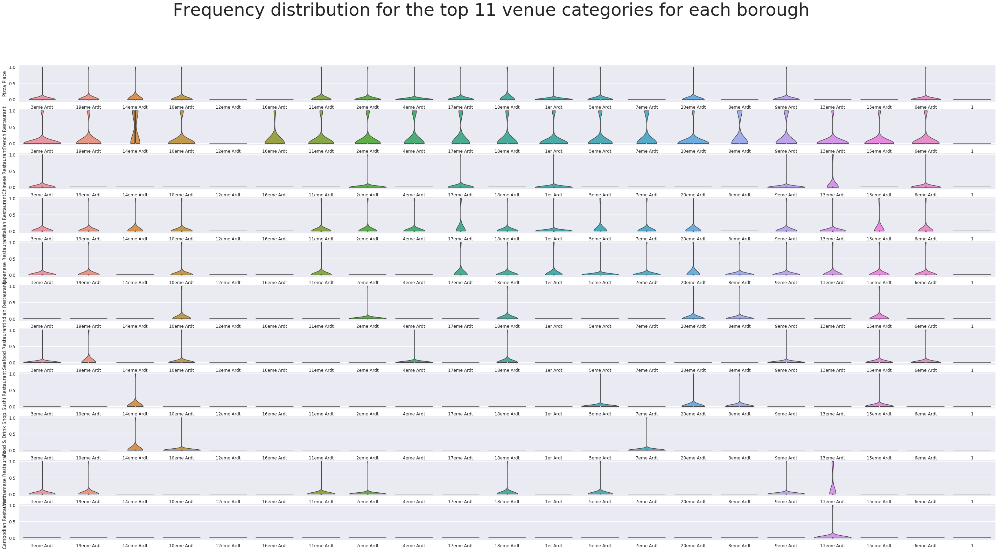

In [70]:
import seaborn as sns

fig = plt.figure(figsize=(50,25))
sns.set(font_scale=1.1)

ax = plt.subplot(11,1,1)
sns.violinplot(x="borough", y="Pizza Place", data=paris_borough, cut=0);
plt.xlabel("")

ax = plt.subplot(11,1,2)
sns.violinplot(x="borough", y="French Restaurant", data=paris_borough, cut=0);
plt.xlabel("")

ax = plt.subplot(11,1,3)
sns.violinplot(x="borough", y="Chinese Restaurant", data=paris_borough, cut=0);
plt.xlabel("")

plt.subplot(11,1,4)
sns.violinplot(x="borough", y="Italian Restaurant", data=paris_borough, cut=0);
plt.xlabel("")

plt.subplot(11,1,5)
sns.violinplot(x="borough", y="Japanese Restaurant", data=paris_borough, cut=0);
plt.xlabel("")

ax = plt.subplot(11,1,6)
sns.violinplot(x="borough", y="Indian Restaurant", data=paris_borough, cut=0);
plt.xlabel("")

ax = plt.subplot(11,1,7)
sns.violinplot(x="borough", y="Seafood Restaurant", data=paris_borough, cut=0);
plt.xlabel("")

ax = plt.subplot(11,1,8)
sns.violinplot(x="borough", y="Sushi Restaurant", data=paris_borough, cut=0);
plt.xlabel("")

ax = plt.subplot(11,1,9)
sns.violinplot(x="borough", y="Food & Drink Shop", data=paris_borough, cut=0);
plt.xlabel("")

ax = plt.subplot(11,1,10)
sns.violinplot(x="borough", y="Vietnamese Restaurant", data=paris_borough, cut=0);
plt.xlabel("")

ax = plt.subplot(11,1,11)
sns.violinplot(x="borough", y="Cambodian Restaurant", data=paris_borough, cut=0);
plt.xlabel("")


fig.suptitle('Frequency distribution for the top 11 venue categories for each borough', fontsize=50)
plt.savefig ("Distribution_Frequency_Venues_11_categories.png", dpi=240)
plt.show()

## Results and Discussion <a name="results"></a>

### Select borough

We can now confirm that: 12ème, 20ème and 16ème boroughs are the best places where we can build new restaurant, beacause they are the least places includes restaurent (all type of restaurent: chinese, italian, french....)

#### Get latitude and Longitude of seelcted borough

In [64]:
# get index of borough number = 12
paris_data.index[paris_data['borough_Num'] == 12].tolist()

[4]

In [65]:
# get index of borough number = 16
paris_data.index[paris_data['borough_Num'] == 16].tolist()

[5]

In [66]:
# get index of borough number = 20
paris_data.index[paris_data['borough_Num'] == 20].tolist()

[14]

In [71]:
# for borough number = 12
borough_num1 = paris_data.loc[4, 'borough_Num']
borough_latitude1 = paris_data.loc[4, 'Latitude'] 
borough_longitude1 = paris_data.loc[4, 'Longitude'] 

# for borough number = 16
borough_num2 = paris_data.loc[5, 'borough_Num']
borough_latitude2 = paris_data.loc[5, 'Latitude'] 
borough_longitude2 = paris_data.loc[5, 'Longitude']

# for borough number = 20
borough_num3 = paris_data.loc[14, 'borough_Num']
borough_latitude3 = paris_data.loc[14, 'Latitude'] 
borough_longitude3 = paris_data.loc[14, 'Longitude']

print('Geographical coordination of the {}éme borough are {}, {}.'.format(borough_num1, borough_latitude1, borough_longitude1))
print('Geographical coordination of the {}éme borough are {}, {}.'.format(borough_num2, borough_latitude2, borough_longitude2))
print('Geographical coordination of the {}éme borough are {}, {}.'.format(borough_num3, borough_latitude3, borough_longitude3))

Geographical coordination of the 12éme borough are 48.83497438, 2.4213249009999998.
Geographical coordination of the 16éme borough are 48.86039211, 2.261970788.
Geographical coordination of the 20éme borough are 48.86346058, 2.401188129.


### Visualize the result in map of Paris

In [12]:
!conda install -c conda-forge folium=0.5.0 --yes 
import folium
# put the result in dataframe:
import pandas as pd
df = pd.DataFrame(index=['0','1','2'], columns=['Arrondissement_Num','Borough','French_name','Latitude', 'Longitude'])
df.at['0', 'Arrondissement_Num'] = 12
df.at['1', 'Arrondissement_Num'] = 16
df.at['2', 'Arrondissement_Num'] = 20
df.at['0', 'Borough'] = 'Reuilly'
df.at['1', 'Borough'] = 'Passy'
df.at['2', 'Borough'] = 'Menilmontant'
df.at['0', 'French_name'] = '12ème'
df.at['1', 'French_name'] = '16ème'
df.at['2', 'French_name'] = '20ème'
df.at['0', 'Latitude'] = 48.834974
df.at['1', 'Latitude'] = 48.860392
df.at['2', 'Latitude'] = 48.863461
df.at['0', 'Longitude'] = 2.421325
df.at['1', 'Longitude'] = 2.261971
df.at['2', 'Longitude'] = 2.401188

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2019.11.28 |       hecc5488_0         145 KB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    openssl-1.1.1d             |       h516909a_0         2.1 MB  conda-forge
    certifi-2019.11.28         |           py36_0         149 KB  conda-forge
    altair-4.0.1               |             py_0         575 KB  conda-forge
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    branca-0.3.1               |             py_0          25 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         3.0 MB

The following NEW packages will be 

In [10]:
df

,Arrondissement_Num,Borough,French_name,Latitude,Longitude
0,12,Reuilly,12ème,48.835,2.42132
1,16,Passy,16ème,48.8604,2.26197
2,20,Menilmontant,20ème,48.8635,2.40119


So, in Paris city, the borough having low restaurant density are Reuilly(12éme borough), Passy(16ème borough) and Menilmontant(20ème boroough).
We can notice that the city center is full of restaurant and it's not a suitable place to open our business.

## Mark the result in map

In [18]:
# Retrieve the Latitude and Longitude for Paris
from geopy.geocoders import Nominatim 

address = 'Paris'

# Define the user_agent as Paris_explorer
geolocator = Nominatim(user_agent="Paris_explorer")

location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

print('The geographical coordinates of Paris France are {}, {}.'.format(latitude, longitude))

The geographical coordinates of Paris France are 48.8566969, 2.3514616.


In [22]:
map_chosen_districts = folium.Map(location=[latitude, longitude], zoom_start=13)

# add markers to map
for lat, lng, label in zip(df['Latitude'], df['Longitude'], df['French_name']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=45,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.2,
        parse_html=False).add_to(map_chosen_districts)  
    
map_chosen_districts

## Conclusion <a name="conclusion"></a>

This project was made to define places, in Paris city, to open new restaurant.
So, we where invited to identify the distribution of current restaurant, to get finally the appropriate places.